In [1]:
import sys
import os
sys.path.append(os.path.join(os.getcwd(), ".."))

import torch
from torch import nn
from torch.utils.data import DataLoader

from tqdm import tqdm
import wandb
import matplotlib.pyplot as plt

from satellite2map.datasets import Maps
from satellite2map.models.generator import UnetGenerator
from satellite2map.models.discriminator import ConditionalDiscriminator
from satellite2map.losses import GeneratorLoss, DiscriminatorLoss
import satellite2map.transforms as T

from dataclasses import dataclass
import time

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# CycleGAN implementation

In [2]:
@dataclass
class hyperparameters:
    # training hyperparams
    n_epochs: int   = 101
    batch_size: int = 32
    lr: float = 1e-4

hyperparams = hyperparameters()

In [3]:
# wandb.init(
#     # set the wandb project where this run will be logged
#     project="satellite2map_cyclegan",

#     # track hyperparameters and run metadata
#     config={
#     "learning_rate": hyperparams.lr,
#     "architecture": "Unet",
#     "dataset": "Maps",
#     "epochs": hyperparams.n_epochs,
#     "batch_size": hyperparams.batch_size,
#     }
# )

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: viniciusandreossi (oficina). Use `wandb login --relogin` to force relogin


## Loading data

In [4]:
transforms = T.Compose([T.Resize((256,256)),
                        T.HorizontalFlip(0.5),
                        T.VerticalFlip(0.5),
                        T.ToTensor(),
                        T.Normalize(mean=[0.5, 0.5, 0.5],
                                     std=[0.5, 0.5, 0.5])])

root_dir = '/home/lucas/p/python/data-science/machine-learning/final_project_ia376/projetos/satellite2map/satellite2map/data/mod'
train_dataset = Maps(root=root_dir, mode='train', transform=transforms, download=False)
val_dataset   = Maps(root=root_dir, mode='val', transform=transforms, download=False)

train_dataloader = DataLoader(train_dataset, batch_size=hyperparams.batch_size, shuffle=True)
val_dataloader   = DataLoader(val_dataset,   batch_size=hyperparams.batch_size, shuffle=True)

1 torch.Size([3, 256, 256]) torch.Size([3, 256, 256])
2 torch.Size([3, 256, 256]) torch.Size([3, 256, 256])
3 torch.Size([3, 256, 256]) torch.Size([3, 256, 256])
4 torch.Size([3, 256, 256]) torch.Size([3, 256, 256])


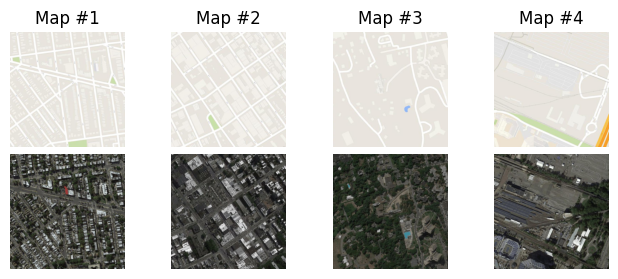

In [5]:
for i, (sat, map) in enumerate(train_dataset):
    i = i + 1
    print(i, sat.shape, map.shape)

    ax = plt.subplot(1, 4, i)
    plt.tight_layout()
    ax.set_title('Satellite #{}'.format(i))
    ax.axis('off')
    sat = sat * 0.5 + 0.5
    plt.imshow(sat.permute((1, 2, 0)).numpy())

    ax = plt.subplot(2, 4, i)
    plt.tight_layout()
    ax.set_title('Map #{}'.format(i))
    ax.axis('off')
    map = map * 0.5 + 0.5
    plt.imshow(map.permute((1, 2, 0)).numpy())

    if i == 4:
        plt.show()
        break

# Preparing for training

In [6]:
# models
generator1 = UnetGenerator().to(DEVICE)
discriminator1 = ConditionalDiscriminator().to(DEVICE)
generator2 = UnetGenerator().to(DEVICE)
discriminator2 = ConditionalDiscriminator().to(DEVICE)

# losses
g_criterion = GeneratorLoss(alpha=1, use_l1=False)
d_criterion = DiscriminatorLoss()
cc_criterion = nn.L1Loss()

# optimizers
g1_optimizer = torch.optim.Adam(generator1.parameters(), lr=hyperparams.lr, betas=(0.5, 0.999))
d1_optimizer = torch.optim.Adam(discriminator1.parameters(), lr=hyperparams.lr, betas=(0.5, 0.999))
g2_optimizer = torch.optim.Adam(generator2.parameters(), lr=hyperparams.lr, betas=(0.5, 0.999))
d2_optimizer = torch.optim.Adam(discriminator2.parameters(), lr=hyperparams.lr, betas=(0.5, 0.999))

## Training loop

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:58<00:00,  1.06s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.99it/s]


[Epoch 1/100]
Train: [G1 loss: 1.5570276726375927] [D1 loss: 0.48257785060188985] [G2 loss: 1.354552768577229] [D2 loss: 0.5505306986245242] ETA: 58.334222078323364
Val: [G1 loss: 0.7484609051184221] [D1 loss: 0.5903346538543701] [G2 loss: 2.6441859115253794] [D2 loss: 0.3961342789910056]
maps: 1.0, 0.24705886840820312
maps: 1.0, 0.5372549295425415
maps: 1.0, 0.545098066329956
maps: 1.0, -0.9058823585510254


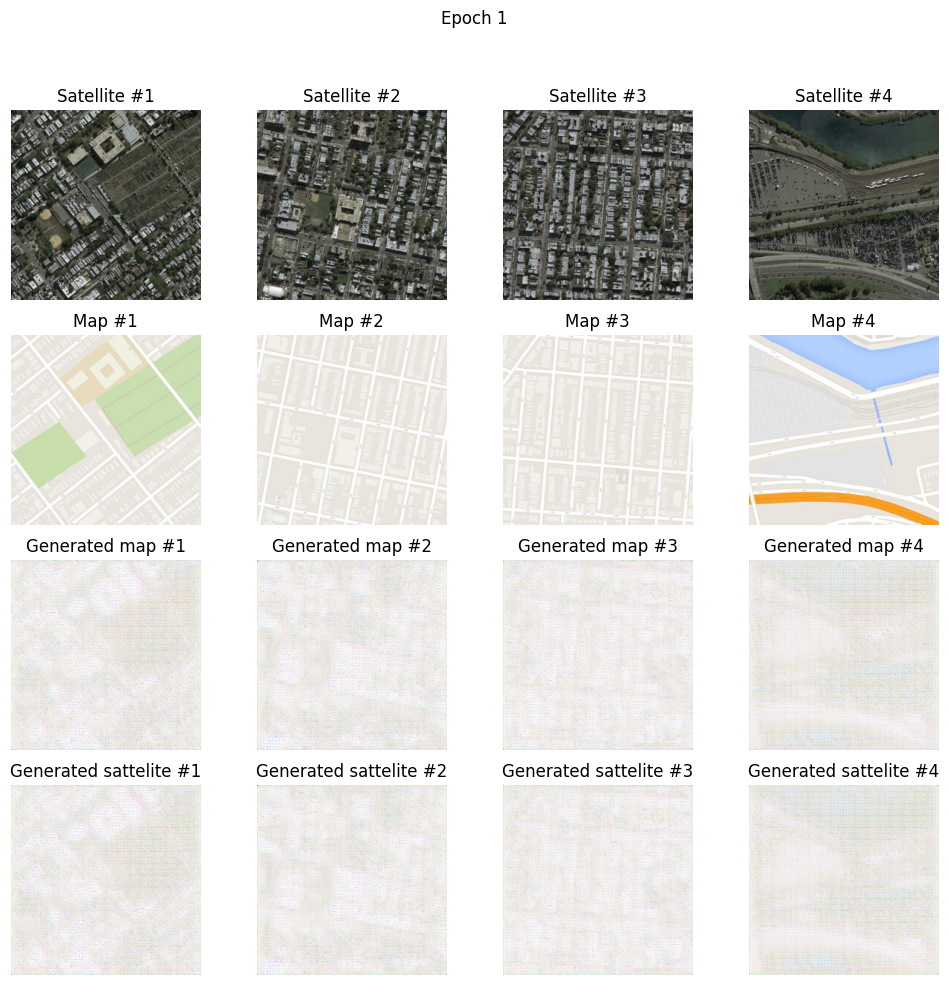

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:24<00:00,  1.54s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.02it/s]


[Epoch 2/100]
Train: [G1 loss: 1.3862815380096436] [D1 loss: 0.5541978288780559] [G2 loss: 1.7723828066479077] [D2 loss: 0.5130602787841451] ETA: 84.5288417339325
Val: [G1 loss: 1.4200471206144853] [D1 loss: 0.4447762424295599] [G2 loss: 2.0168495828455146] [D2 loss: 0.5599509856917642]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:24<00:00,  1.54s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.09it/s]


[Epoch 3/100]
Train: [G1 loss: 1.6383584011684764] [D1 loss: 0.5003283516927199] [G2 loss: 1.7733518513766202] [D2 loss: 0.48961767879399387] ETA: 84.43341183662415
Val: [G1 loss: 1.0459925478154963] [D1 loss: 0.44596295194192365] [G2 loss: 1.4090115590529009] [D2 loss: 0.3985041759230874]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:23<00:00,  1.52s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.05it/s]


[Epoch 4/100]
Train: [G1 loss: 1.8674527536739003] [D1 loss: 0.4157042606310411] [G2 loss: 1.8870687018741261] [D2 loss: 0.49028189182281495] ETA: 83.76988363265991
Val: [G1 loss: 1.1233817447315564] [D1 loss: 0.46172870289195667] [G2 loss: 1.3982712897387417] [D2 loss: 0.37531680410558527]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:24<00:00,  1.53s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.97it/s]


[Epoch 5/100]
Train: [G1 loss: 2.1123945420438592] [D1 loss: 0.39479662775993346] [G2 loss: 2.218094277381897] [D2 loss: 0.43228958411650226] ETA: 84.10474276542664
Val: [G1 loss: 1.4247882799668745] [D1 loss: 0.34229953722520307] [G2 loss: 1.5157207250595093] [D2 loss: 0.34076117927377875]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:24<00:00,  1.54s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.96it/s]


[Epoch 6/100]
Train: [G1 loss: 2.008572182872079] [D1 loss: 0.4020074351267381] [G2 loss: 2.488286490873857] [D2 loss: 0.39458602423017675] ETA: 84.77268743515015
Val: [G1 loss: 1.595210227099332] [D1 loss: 0.34267776391722937] [G2 loss: 0.8378729766065424] [D2 loss: 0.40742679075761273]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:25<00:00,  1.56s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.04it/s]


[Epoch 7/100]
Train: [G1 loss: 2.035894272544167] [D1 loss: 0.38513018109581687] [G2 loss: 2.610468478636308] [D2 loss: 0.4115708118135279] ETA: 85.61544489860535
Val: [G1 loss: 1.5572663653980603] [D1 loss: 0.31637658043341205] [G2 loss: 1.2261080091649836] [D2 loss: 0.3189260038462552]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:25<00:00,  1.55s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.97it/s]


[Epoch 8/100]
Train: [G1 loss: 2.145972327752547] [D1 loss: 0.37787507501515477] [G2 loss: 2.8796489065343684] [D2 loss: 0.33408420275558126] ETA: 85.44196200370789
Val: [G1 loss: 1.3601357286626643] [D1 loss: 0.3133749745108865] [G2 loss: 2.2507994283329356] [D2 loss: 0.2039121606133201]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:26<00:00,  1.57s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.04it/s]


[Epoch 9/100]
Train: [G1 loss: 2.1478831432082437] [D1 loss: 0.3815999041904103] [G2 loss: 2.995236726240678] [D2 loss: 0.33381306556138124] ETA: 86.47404432296753
Val: [G1 loss: 0.7469901171597567] [D1 loss: 0.43735264106230304] [G2 loss: 2.434002009305087] [D2 loss: 0.21864434534853155]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.03it/s]


[Epoch 10/100]
Train: [G1 loss: 2.209606876156547] [D1 loss: 0.35862039869481865] [G2 loss: 2.9870447115464644] [D2 loss: 0.3289330997250297] ETA: 88.44087839126587
Val: [G1 loss: 2.470955111763694] [D1 loss: 0.33649903535842896] [G2 loss: 2.1346240693872627] [D2 loss: 0.18448471616614948]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:29<00:00,  1.62s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.07it/s]


[Epoch 11/100]
Train: [G1 loss: 2.3453934517773716] [D1 loss: 0.3145478440956636] [G2 loss: 3.1569318662990224] [D2 loss: 0.34646276967091993] ETA: 89.27489733695984
Val: [G1 loss: 2.354051850058816] [D1 loss: 0.25461954962123523] [G2 loss: 1.8093689354983242] [D2 loss: 0.24091995439746164]
maps: 1.0, 0.24705886840820312
maps: 1.0, 0.5686274766921997
maps: 1.0, -0.8117647171020508
maps: 1.0, 0.15294122695922852


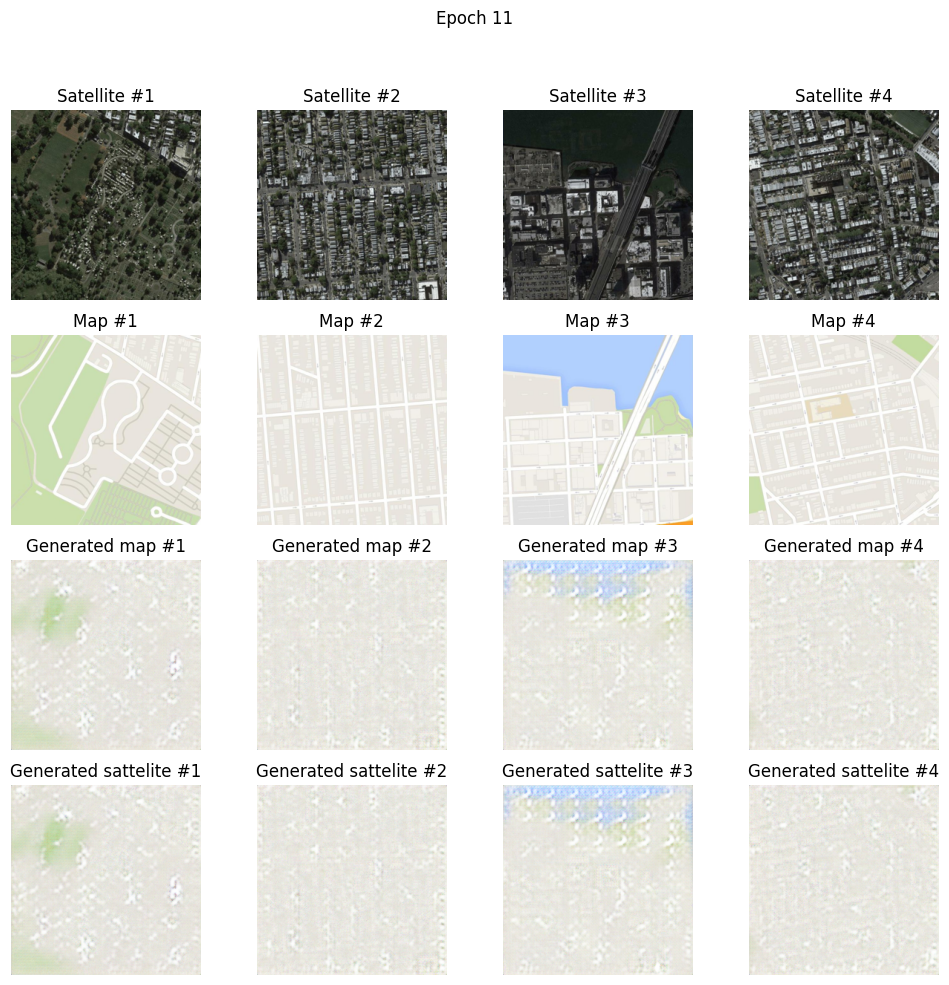

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.99it/s]


[Epoch 12/100]
Train: [G1 loss: 2.5936640067534014] [D1 loss: 0.25277714268727736] [G2 loss: 2.974180741743608] [D2 loss: 0.3215953810648485] ETA: 88.1603217124939
Val: [G1 loss: 1.8222000273791226] [D1 loss: 0.21978268975561316] [G2 loss: 2.692680250514637] [D2 loss: 0.15985812111334366]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.01it/s]


[Epoch 13/100]
Train: [G1 loss: 2.5571325247937984] [D1 loss: 0.28519763513044877] [G2 loss: 3.306568089398471] [D2 loss: 0.2771191732449965] ETA: 88.00865530967712
Val: [G1 loss: 1.18041823127053] [D1 loss: 0.2853148498318412] [G2 loss: 2.3396918231790718] [D2 loss: 0.23534426093101501]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.05it/s]


[Epoch 14/100]
Train: [G1 loss: 2.802321709286083] [D1 loss: 0.19254073852842504] [G2 loss: 3.5087365453893486] [D2 loss: 0.27503538809039374] ETA: 88.26085591316223
Val: [G1 loss: 3.0595336827364834] [D1 loss: 0.21714663099158893] [G2 loss: 2.856077020818537] [D2 loss: 0.11221185462041335]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.05it/s]


[Epoch 15/100]
Train: [G1 loss: 2.76046305027875] [D1 loss: 0.2779623782092875] [G2 loss: 3.5375851154327393] [D2 loss: 0.29826760413971815] ETA: 88.55612587928772
Val: [G1 loss: 2.7802232829007236] [D1 loss: 0.2168833315372467] [G2 loss: 4.121387763456865] [D2 loss: 0.2909664945168929]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.12it/s]


[Epoch 16/100]
Train: [G1 loss: 2.9264088955792515] [D1 loss: 0.27983428781682795] [G2 loss: 3.353661613030867] [D2 loss: 0.33297521661628376] ETA: 87.80017232894897
Val: [G1 loss: 1.8715046860954978] [D1 loss: 0.21067008647051724] [G2 loss: 1.3319733467969028] [D2 loss: 0.3128620548681779]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.15it/s]


[Epoch 17/100]
Train: [G1 loss: 2.8492991382425483] [D1 loss: 0.20001303946430032] [G2 loss: 3.4461266430941495] [D2 loss: 0.29927492873235184] ETA: 88.15271091461182
Val: [G1 loss: 3.4419951005415483] [D1 loss: 0.16229225966063413] [G2 loss: 2.873601349917325] [D2 loss: 0.16952581297267566]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.89it/s]


[Epoch 18/100]
Train: [G1 loss: 3.1214069409803913] [D1 loss: 0.18710287579081275] [G2 loss: 3.3396333304318513] [D2 loss: 0.32610038220882415] ETA: 87.5634195804596
Val: [G1 loss: 1.7278075760061091] [D1 loss: 0.19235714728182013] [G2 loss: 2.740296147086404] [D2 loss: 0.21005150540308518]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.11it/s]


[Epoch 19/100]
Train: [G1 loss: 3.22656464359977] [D1 loss: 0.1954129392450506] [G2 loss: 3.474857241457159] [D2 loss: 0.32159845503893764] ETA: 87.57662868499756
Val: [G1 loss: 2.6371418562802402] [D1 loss: 0.12427338754588907] [G2 loss: 1.3608518730510364] [D2 loss: 0.34246028553355823]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.11it/s]


[Epoch 20/100]
Train: [G1 loss: 3.2916498032483186] [D1 loss: 0.2142807044766166] [G2 loss: 3.5231572194532914] [D2 loss: 0.30486782735044304] ETA: 88.18224716186523
Val: [G1 loss: 2.08462486483834] [D1 loss: 0.19267674467780374] [G2 loss: 3.479979926889593] [D2 loss: 0.18153193593025208]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.10it/s]


[Epoch 21/100]
Train: [G1 loss: 3.5884646849198774] [D1 loss: 0.16557560725645584] [G2 loss: 3.6042230996218594] [D2 loss: 0.30094983062960884] ETA: 87.76698422431946
Val: [G1 loss: 2.9161361781033603] [D1 loss: 0.10656102137132124] [G2 loss: 2.677072676745328] [D2 loss: 0.18279456279494546]
maps: 1.0, 0.2705882787704468
maps: 1.0, 0.14509809017181396
maps: 1.0, 0.23137259483337402
maps: 1.0, -0.9372549057006836


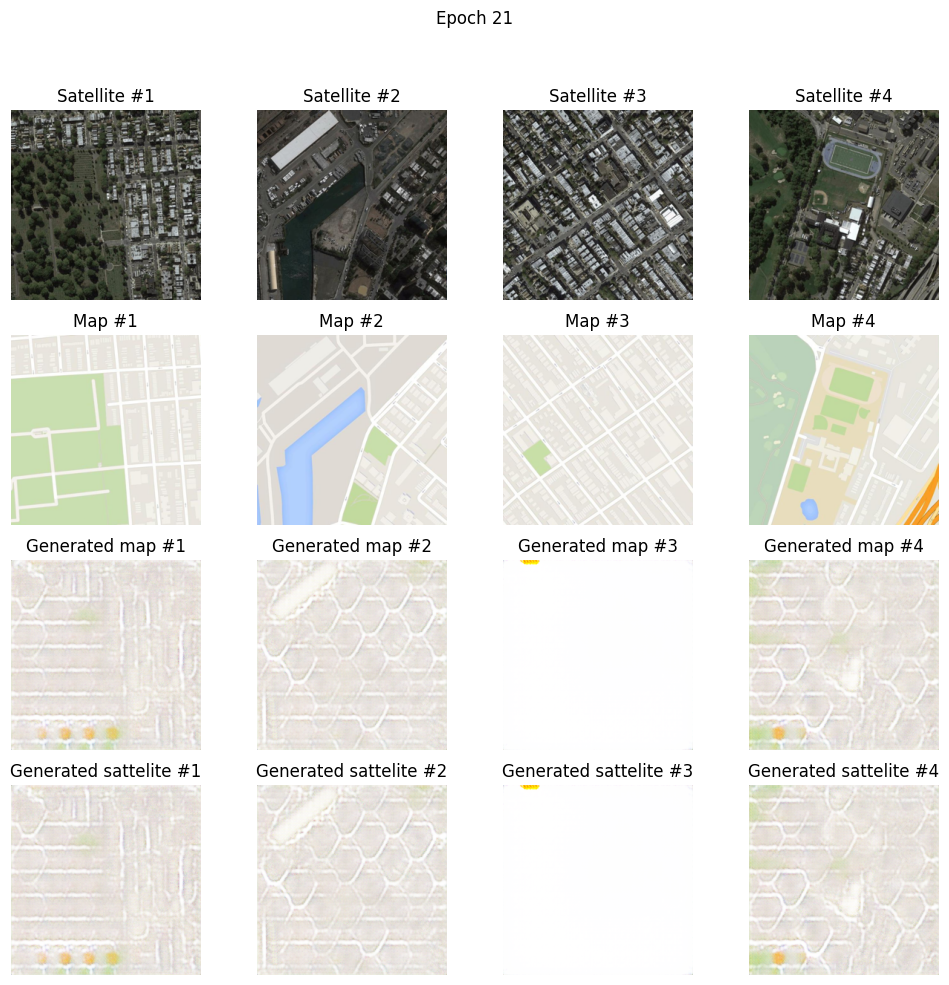

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.62s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.99it/s]


[Epoch 22/100]
Train: [G1 loss: 3.3474698846990414] [D1 loss: 0.1864722788333893] [G2 loss: 3.735146561535922] [D2 loss: 0.2938898796384985] ETA: 88.84193062782288
Val: [G1 loss: 2.538382725282149] [D1 loss: 0.13500195335258136] [G2 loss: 2.645157293839888] [D2 loss: 0.2462633658539165]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.11it/s]


[Epoch 23/100]
Train: [G1 loss: 3.347229591282931] [D1 loss: 0.17753961980342864] [G2 loss: 3.325178367441351] [D2 loss: 0.31914115873250093] ETA: 87.81694006919861
Val: [G1 loss: 2.2597003199837427] [D1 loss: 0.14948110756548968] [G2 loss: 2.534867828542536] [D2 loss: 0.14472775635394183]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.07it/s]


[Epoch 24/100]
Train: [G1 loss: 3.288624481721358] [D1 loss: 0.18189196424050766] [G2 loss: 3.7531087398529053] [D2 loss: 0.26849650740623476] ETA: 88.14517092704773
Val: [G1 loss: 2.635421384464611] [D1 loss: 0.12072638083587993] [G2 loss: 3.806319691918113] [D2 loss: 0.30026303096251056]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:29<00:00,  1.62s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.15it/s]


[Epoch 25/100]
Train: [G1 loss: 3.318884102864699] [D1 loss: 0.2369458010250872] [G2 loss: 3.913217475197532] [D2 loss: 0.2728379424322735] ETA: 89.17541480064392
Val: [G1 loss: 4.4988907467235215] [D1 loss: 0.6251971938393333] [G2 loss: 2.52543720332059] [D2 loss: 0.1392965709621256]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.92it/s]


[Epoch 26/100]
Train: [G1 loss: 2.865064708753066] [D1 loss: 0.22383394701914353] [G2 loss: 3.7447675119746817] [D2 loss: 0.3039796993136406] ETA: 87.9989116191864
Val: [G1 loss: 2.2720898498188364] [D1 loss: 0.22106558761813425] [G2 loss: 2.407942945306951] [D2 loss: 0.31555591117252]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.90it/s]


[Epoch 27/100]
Train: [G1 loss: 2.937511500445279] [D1 loss: 0.2561725369908593] [G2 loss: 3.7919478026303377] [D2 loss: 0.2942163956436244] ETA: 88.34747242927551
Val: [G1 loss: 2.396807453849099] [D1 loss: 0.29208360476927325] [G2 loss: 3.3325292847373267] [D2 loss: 0.3244137601418929]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.22it/s]


[Epoch 28/100]
Train: [G1 loss: 2.828706196221438] [D1 loss: 0.28793681291016665] [G2 loss: 3.8005612546747383] [D2 loss: 0.28791770176454023] ETA: 88.24088716506958
Val: [G1 loss: 2.788251595063643] [D1 loss: 0.2657736431468617] [G2 loss: 3.14784929969094] [D2 loss: 0.14344752783125098]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.21it/s]


[Epoch 29/100]
Train: [G1 loss: 2.699864533814517] [D1 loss: 0.30772315182469107] [G2 loss: 3.7640016902576794] [D2 loss: 0.2836497427387671] ETA: 87.2744390964508
Val: [G1 loss: 2.0989550352096558] [D1 loss: 0.2744791399348866] [G2 loss: 3.681042497808283] [D2 loss: 0.36627385833046655]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.07it/s]


[Epoch 30/100]
Train: [G1 loss: 2.682225478779186] [D1 loss: 0.26210414225404916] [G2 loss: 3.8620617346330124] [D2 loss: 0.2800440525466746] ETA: 87.55742645263672
Val: [G1 loss: 1.7476575157859109] [D1 loss: 0.25401729345321655] [G2 loss: 1.3384182344783435] [D2 loss: 0.2575520737604661]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.97it/s]


[Epoch 31/100]
Train: [G1 loss: 2.778981290080331] [D1 loss: 0.32513095357201316] [G2 loss: 3.8023780996149235] [D2 loss: 0.27424867071888664] ETA: 87.76638102531433
Val: [G1 loss: 1.2328853823921897] [D1 loss: 0.3311745118011128] [G2 loss: 2.3725597858428955] [D2 loss: 0.19746504588560623]
maps: 1.0, 0.5215686559677124
maps: 1.0, 0.30980396270751953
maps: 1.0, 0.4274510145187378
maps: 1.0, 0.2862745523452759


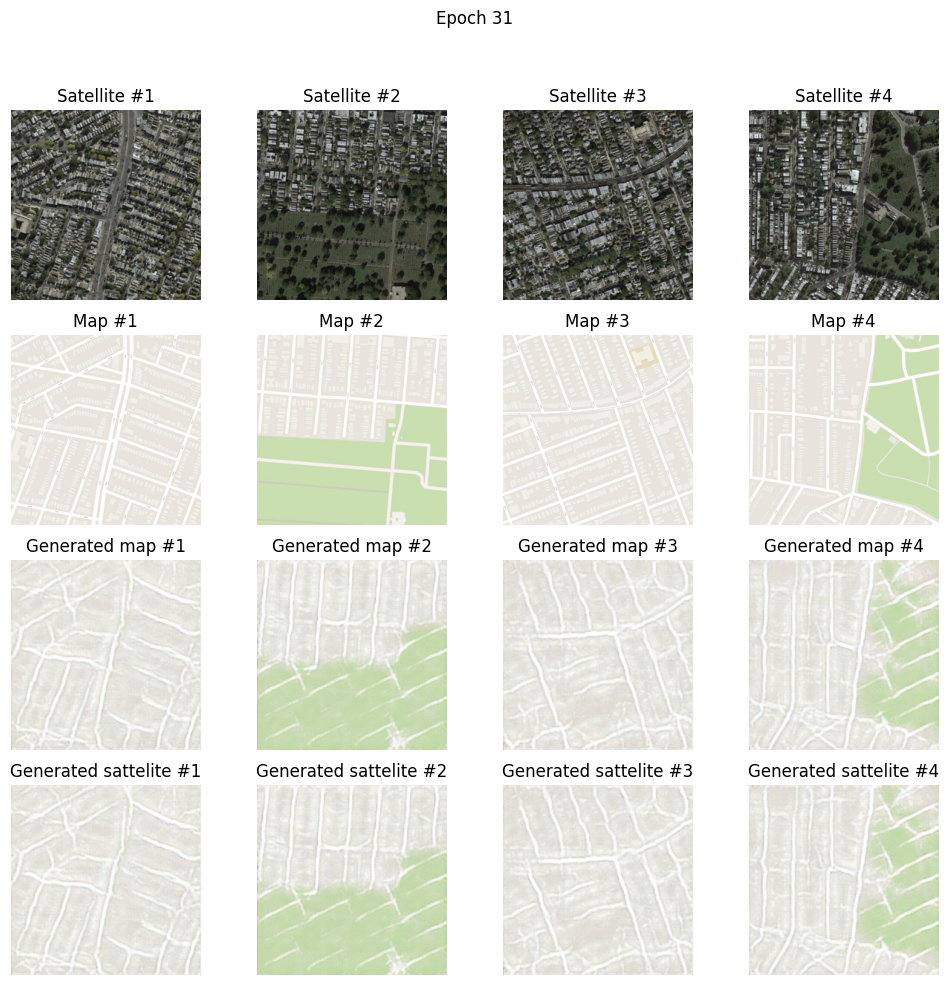

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:06<00:00,  1.81it/s]


[Epoch 32/100]
Train: [G1 loss: 2.64508590481498] [D1 loss: 0.28537043929100037] [G2 loss: 3.9713501973585648] [D2 loss: 0.2816903694109483] ETA: 87.25007057189941
Val: [G1 loss: 1.4783039634877986] [D1 loss: 0.32141568714922125] [G2 loss: 4.5730767683549365] [D2 loss: 0.3714884438297965]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.15it/s]


[Epoch 33/100]
Train: [G1 loss: 2.7588289737701417] [D1 loss: 0.2849085032939911] [G2 loss: 3.705849463289434] [D2 loss: 0.33369850983673877] ETA: 88.18670988082886
Val: [G1 loss: 4.126402963291515] [D1 loss: 0.6446993350982666] [G2 loss: 2.981032956730236] [D2 loss: 0.233307115056298]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.10it/s]


[Epoch 34/100]
Train: [G1 loss: 2.70414662361145] [D1 loss: 0.2828636814247478] [G2 loss: 3.8953333941372956] [D2 loss: 0.294236764989116] ETA: 87.78001713752747
Val: [G1 loss: 1.867920908060941] [D1 loss: 0.2650635161183097] [G2 loss: 2.98982327634638] [D2 loss: 0.18654913116585126]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.10it/s]


[Epoch 35/100]
Train: [G1 loss: 2.852055228840221] [D1 loss: 0.29649817117235877] [G2 loss: 3.4864753072912045] [D2 loss: 0.30377554920586675] ETA: 88.1431303024292
Val: [G1 loss: 2.0426940701224585] [D1 loss: 0.2711166603998704] [G2 loss: 2.672275088050149] [D2 loss: 0.16780128262259744]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.20it/s]


[Epoch 36/100]
Train: [G1 loss: 2.5579694921320133] [D1 loss: 0.3519750047813762] [G2 loss: 3.8260278658433395] [D2 loss: 0.26453062173995107] ETA: 88.77125668525696
Val: [G1 loss: 2.395032037388195] [D1 loss: 0.27490703897042706] [G2 loss: 2.7310871427709404] [D2 loss: 0.17004893178289587]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.08it/s]


[Epoch 37/100]
Train: [G1 loss: 2.6292846766385165] [D1 loss: 0.33304726183414457] [G2 loss: 3.656851131265814] [D2 loss: 0.3282476874915036] ETA: 88.22682213783264
Val: [G1 loss: 1.8925473473288796] [D1 loss: 0.28330991484902124] [G2 loss: 2.8657049482518975] [D2 loss: 0.2588883489370346]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.13it/s]


[Epoch 38/100]
Train: [G1 loss: 2.685185648094524] [D1 loss: 0.2768762786280025] [G2 loss: 3.6825080741535534] [D2 loss: 0.2949520372531631] ETA: 87.79448580741882
Val: [G1 loss: 3.3664877631447534] [D1 loss: 0.255964919924736] [G2 loss: 2.8546431281349878] [D2 loss: 0.12948452207175168]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.05it/s]


[Epoch 39/100]
Train: [G1 loss: 2.7238454547795383] [D1 loss: 0.2966455459594727] [G2 loss: 3.7177002776752817] [D2 loss: 0.28664704764431176] ETA: 87.76987290382385
Val: [G1 loss: 3.0369297807866875] [D1 loss: 0.30992535569451074] [G2 loss: 3.3964342420751397] [D2 loss: 0.12260524996302345]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.22it/s]


[Epoch 40/100]
Train: [G1 loss: 2.610944468324835] [D1 loss: 0.29914276626977054] [G2 loss: 3.9904050913724034] [D2 loss: 0.2852851396257227] ETA: 88.15279269218445
Val: [G1 loss: 1.9272904612801292] [D1 loss: 0.29418843578208576] [G2 loss: 2.5245359377427534] [D2 loss: 0.12759444388476285]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:06<00:00,  1.80it/s]


[Epoch 41/100]
Train: [G1 loss: 2.7959507595409048] [D1 loss: 0.2796790732578798] [G2 loss: 3.818854570388794] [D2 loss: 0.248156231099909] ETA: 88.01145267486572
Val: [G1 loss: 4.045794660394842] [D1 loss: 0.44396354122595355] [G2 loss: 4.250530481338501] [D2 loss: 0.24378961324691772]
maps: 1.0, 0.2549020051956177
maps: 1.0, 0.16862750053405762
maps: 1.0, 0.529411792755127
maps: 1.0, 0.5058823823928833


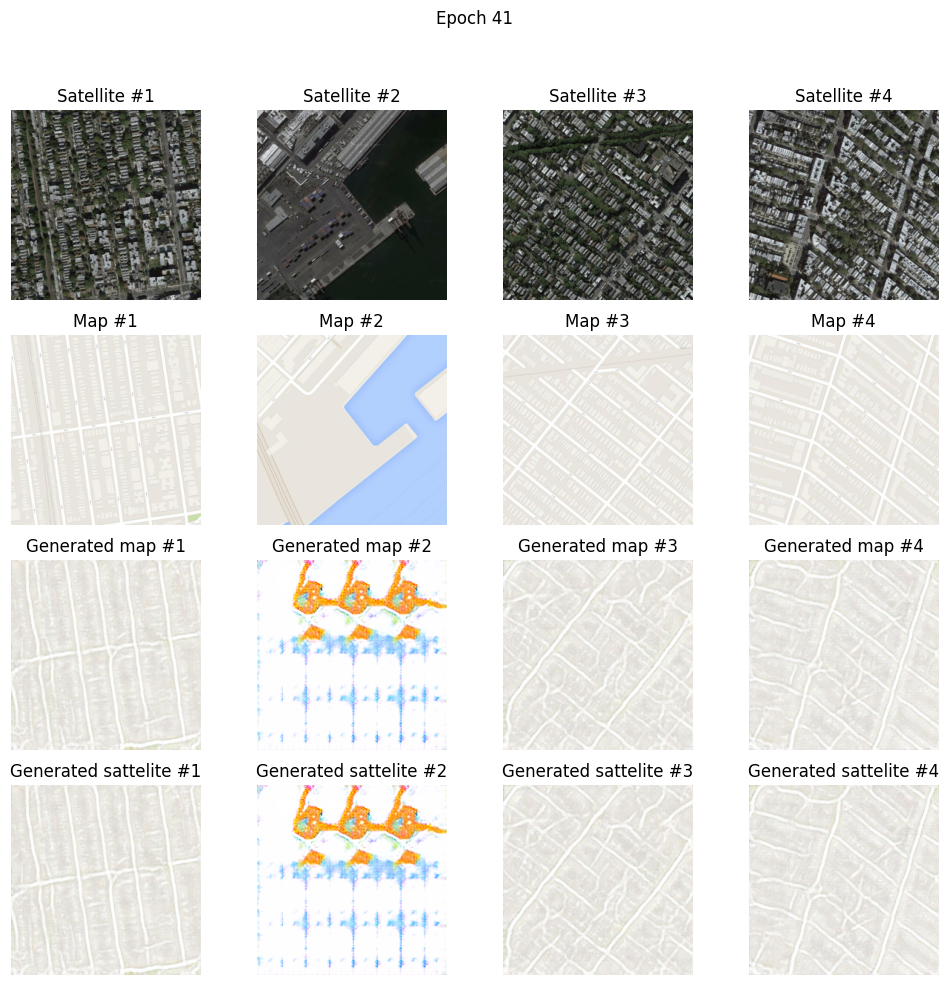

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.01it/s]


[Epoch 42/100]
Train: [G1 loss: 3.144278136166659] [D1 loss: 0.25943406495181] [G2 loss: 3.945212145285173] [D2 loss: 0.31403084004467186] ETA: 88.25672006607056
Val: [G1 loss: 3.6576029387387363] [D1 loss: 0.19652944938703018] [G2 loss: 2.2549255327744917] [D2 loss: 0.13871714066375385]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:29<00:00,  1.63s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.08it/s]


[Epoch 43/100]
Train: [G1 loss: 2.970262551307678] [D1 loss: 0.2401462805542079] [G2 loss: 4.09827747778459] [D2 loss: 0.24375668140974913] ETA: 89.67229890823364
Val: [G1 loss: 4.325900077819824] [D1 loss: 0.5194782641800967] [G2 loss: 3.4324944019317627] [D2 loss: 0.15945371308109976]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.97it/s]


[Epoch 44/100]
Train: [G1 loss: 3.1101828423413362] [D1 loss: 0.263191020488739] [G2 loss: 4.027627407420765] [D2 loss: 0.29173369990153747] ETA: 88.61049890518188
Val: [G1 loss: 2.78384390744296] [D1 loss: 0.4553079361265356] [G2 loss: 5.117226600646973] [D2 loss: 0.7075021808797662]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.90it/s]


[Epoch 45/100]
Train: [G1 loss: 2.8514161066575485] [D1 loss: 0.3110532717271285] [G2 loss: 3.8319823546843095] [D2 loss: 0.31606371958147395] ETA: 87.58306217193604
Val: [G1 loss: 2.0582913268696177] [D1 loss: 0.26424459706653247] [G2 loss: 3.041968757455999] [D2 loss: 0.18741597641598096]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.24it/s]


[Epoch 46/100]
Train: [G1 loss: 2.678104077685963] [D1 loss: 0.28297024044123564] [G2 loss: 4.1242444255135275] [D2 loss: 0.2529308026487177] ETA: 88.22379493713379
Val: [G1 loss: 2.23862944949757] [D1 loss: 0.2318276275287975] [G2 loss: 1.8216367743232034] [D2 loss: 0.20252067392522638]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.02it/s]


[Epoch 47/100]
Train: [G1 loss: 2.9021655071865426] [D1 loss: 0.2567518586462194] [G2 loss: 4.153007277575406] [D2 loss: 0.2700015287507664] ETA: 88.59406757354736
Val: [G1 loss: 2.185111501000144] [D1 loss: 0.23877312513914975] [G2 loss: 2.4149516929279673] [D2 loss: 0.12180180712179704]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.12it/s]


[Epoch 48/100]
Train: [G1 loss: 2.902746389128945] [D1 loss: 0.2874286510727622] [G2 loss: 4.177886780825529] [D2 loss: 0.25332020114768633] ETA: 87.8473310470581
Val: [G1 loss: 2.385512850501321] [D1 loss: 0.23322578858245502] [G2 loss: 2.051928249272433] [D2 loss: 0.18211522156541998]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:29<00:00,  1.63s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.04it/s]


[Epoch 49/100]
Train: [G1 loss: 3.075770867954601] [D1 loss: 0.24067197848450053] [G2 loss: 3.8583361322229557] [D2 loss: 0.2694382766431028] ETA: 89.5735251903534
Val: [G1 loss: 1.8573653806339612] [D1 loss: 0.2605668021873994] [G2 loss: 4.102832945910367] [D2 loss: 0.13400692560456015]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.14it/s]


[Epoch 50/100]
Train: [G1 loss: 3.0372035004875877] [D1 loss: 0.23544351892037826] [G2 loss: 4.046646295894276] [D2 loss: 0.2517737342552705] ETA: 88.43405318260193
Val: [G1 loss: 4.044079520485618] [D1 loss: 0.4065253599123521] [G2 loss: 3.5494943748820913] [D2 loss: 0.16432399234988473]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.17it/s]


[Epoch 51/100]
Train: [G1 loss: 3.1068480719219553] [D1 loss: 0.2588119162754579] [G2 loss: 3.884506433660334] [D2 loss: 0.2619674517349763] ETA: 87.78036212921143
Val: [G1 loss: 1.81835016337308] [D1 loss: 0.23490996116941626] [G2 loss: 3.738974159414118] [D2 loss: 0.21053937483917584]
maps: 1.0, 0.23137259483337402
maps: 1.0, 0.23137259483337402
maps: 1.0, -0.9372549057006836
maps: 1.0, 0.14509809017181396


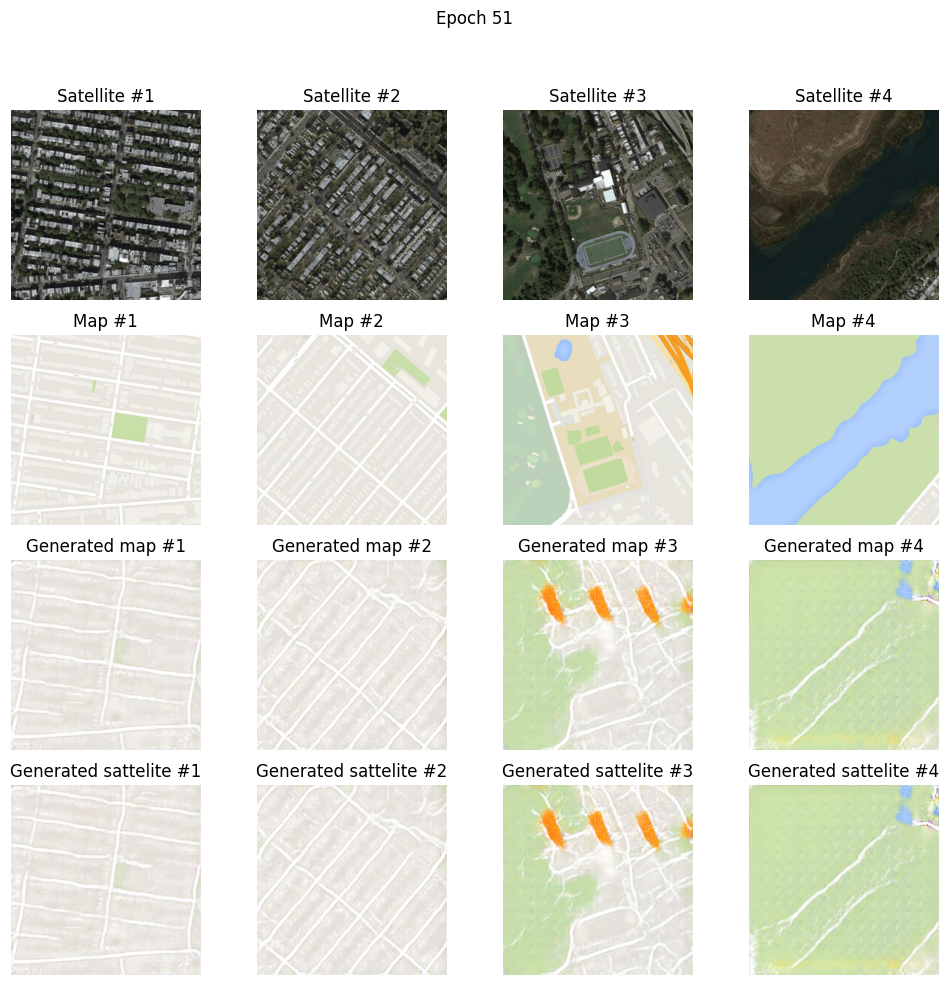

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.14it/s]


[Epoch 52/100]
Train: [G1 loss: 3.1253534056923606] [D1 loss: 0.2371393929828297] [G2 loss: 4.086669293316928] [D2 loss: 0.24065432832999664] ETA: 87.85338640213013
Val: [G1 loss: 3.5967020338231865] [D1 loss: 0.3104224773970517] [G2 loss: 3.8623206181959673] [D2 loss: 0.161417771469463]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.01it/s]


[Epoch 53/100]
Train: [G1 loss: 3.169565826112574] [D1 loss: 0.22989538609981536] [G2 loss: 4.228690455176613] [D2 loss: 0.2600618294694207] ETA: 88.77330350875854
Val: [G1 loss: 4.6658782958984375] [D1 loss: 0.48402704163031146] [G2 loss: 4.0360517068342725] [D2 loss: 0.12076240303841504]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.62s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.01it/s]


[Epoch 54/100]
Train: [G1 loss: 3.3430620345202358] [D1 loss: 0.2479586965658448] [G2 loss: 4.382498645782471] [D2 loss: 0.2497213519432328] ETA: 88.87224435806274
Val: [G1 loss: 2.153783744031733] [D1 loss: 0.17850149897011844] [G2 loss: 4.01787653836337] [D2 loss: 0.20294978808272968]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.07it/s]


[Epoch 55/100]
Train: [G1 loss: 3.256230050867254] [D1 loss: 0.23615979660641062] [G2 loss: 4.109601146524603] [D2 loss: 0.2766503236510537] ETA: 88.36294507980347
Val: [G1 loss: 1.5026515288786455] [D1 loss: 0.31544883142818103] [G2 loss: 3.9882649941877886] [D2 loss: 0.2123189690438184]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.93it/s]


[Epoch 56/100]
Train: [G1 loss: 3.3120597059076484] [D1 loss: 0.2407883113080805] [G2 loss: 4.065471514788541] [D2 loss: 0.2643509261987426] ETA: 88.16711473464966
Val: [G1 loss: 2.2989167950370093] [D1 loss: 0.2064777910709381] [G2 loss: 3.5651254653930664] [D2 loss: 0.14246219802986493]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.03it/s]


[Epoch 57/100]
Train: [G1 loss: 3.4701135619120165] [D1 loss: 0.2917916590517217] [G2 loss: 3.9118604855103927] [D2 loss: 0.297037425366315] ETA: 88.24360275268555
Val: [G1 loss: 2.611241102218628] [D1 loss: 0.33987402645024384] [G2 loss: 3.4333671873266045] [D2 loss: 0.1871818805282766]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.14it/s]


[Epoch 58/100]
Train: [G1 loss: 3.050757785276933] [D1 loss: 0.26698619723320005] [G2 loss: 4.048896997625177] [D2 loss: 0.24730834324251522] ETA: 87.44679832458496
Val: [G1 loss: 1.3891220417889683] [D1 loss: 0.31676202470606024] [G2 loss: 2.944780631498857] [D2 loss: 0.11610740965062921]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.58s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.93it/s]


[Epoch 59/100]
Train: [G1 loss: 3.2177740400487727] [D1 loss: 0.2695867531678893] [G2 loss: 4.003929792750966] [D2 loss: 0.2925935095006769] ETA: 87.0116138458252
Val: [G1 loss: 1.9853375933387063] [D1 loss: 0.23144355687228116] [G2 loss: 2.910798419605602] [D2 loss: 0.20043805918910287]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.14it/s]


[Epoch 60/100]
Train: [G1 loss: 3.129428232799877] [D1 loss: 0.23321714049035852] [G2 loss: 3.8366369984366675] [D2 loss: 0.25216654268178074] ETA: 88.54618692398071
Val: [G1 loss: 3.260678681460294] [D1 loss: 0.24818558449094946] [G2 loss: 2.620639670978893] [D2 loss: 0.11963525414466858]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.14it/s]


[Epoch 61/100]
Train: [G1 loss: 3.2786483656276357] [D1 loss: 0.2365207147869197] [G2 loss: 3.916946033997969] [D2 loss: 0.25641395232894204] ETA: 87.65215611457825
Val: [G1 loss: 4.6959637295116075] [D1 loss: 0.3505706489086151] [G2 loss: 1.9698206077922473] [D2 loss: 0.1962375735694712]
maps: 1.0, 0.14509809017181396
maps: 1.0, 0.2627451419830322
maps: 1.0, -0.8588235378265381
maps: 1.0, 0.2549020051956177


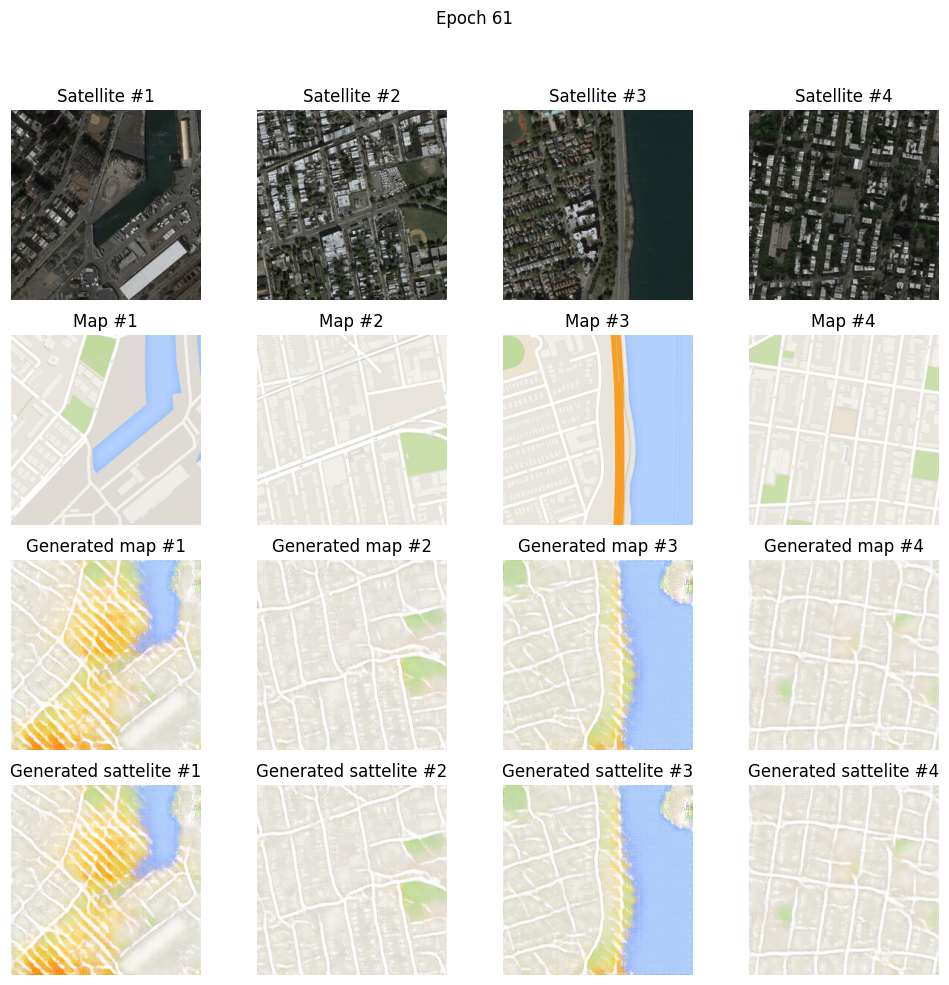

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.99it/s]


[Epoch 62/100]
Train: [G1 loss: 3.1316405166279186] [D1 loss: 0.28691574917598206] [G2 loss: 3.972527627511458] [D2 loss: 0.29134018949486995] ETA: 87.28106045722961
Val: [G1 loss: 1.622544288635254] [D1 loss: 0.23818328028375452] [G2 loss: 3.1440418633547695] [D2 loss: 0.11587513509121808]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.90it/s]


[Epoch 63/100]
Train: [G1 loss: 3.2520358009771866] [D1 loss: 0.2041795316067609] [G2 loss: 4.073008671673861] [D2 loss: 0.27555299861864613] ETA: 87.82520198822021
Val: [G1 loss: 2.7636977325786245] [D1 loss: 0.16900694776665082] [G2 loss: 3.5898966139013115] [D2 loss: 0.10591614788228815]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.00it/s]


[Epoch 64/100]
Train: [G1 loss: 3.3002116241238335] [D1 loss: 0.22600373232906515] [G2 loss: 4.147093920274214] [D2 loss: 0.27280388230627234] ETA: 87.72451210021973
Val: [G1 loss: 3.9596325917677446] [D1 loss: 0.8101066892797296] [G2 loss: 3.5775477669455786] [D2 loss: 0.17771935192021457]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.01it/s]


[Epoch 65/100]
Train: [G1 loss: 2.9823734760284424] [D1 loss: 0.23948631991039623] [G2 loss: 4.4585770043459805] [D2 loss: 0.22542975450103933] ETA: 88.81351494789124
Val: [G1 loss: 3.8767987164584072] [D1 loss: 0.3277799703858115] [G2 loss: 1.8928451538085938] [D2 loss: 0.24237072603269058]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.00it/s]


[Epoch 66/100]
Train: [G1 loss: 3.1690954966978593] [D1 loss: 0.2786844177679582] [G2 loss: 4.334486774964766] [D2 loss: 0.2566399731419303] ETA: 88.48281836509705
Val: [G1 loss: 2.45880709994923] [D1 loss: 0.2533345574682409] [G2 loss: 4.219354022632945] [D2 loss: 0.11832347512245178]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:26<00:00,  1.57s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.93it/s]


[Epoch 67/100]
Train: [G1 loss: 3.042344496466897] [D1 loss: 0.21667067869143053] [G2 loss: 4.303307511589744] [D2 loss: 0.2515279906717214] ETA: 86.60172367095947
Val: [G1 loss: 2.3278473940762607] [D1 loss: 0.15763265165415677] [G2 loss: 3.349093372171575] [D2 loss: 0.1390801559795033]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:29<00:00,  1.63s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.89it/s]


[Epoch 68/100]
Train: [G1 loss: 3.298129287633029] [D1 loss: 0.23559247932650826] [G2 loss: 4.482631861079823] [D2 loss: 0.2954117071899501] ETA: 89.53451704978943
Val: [G1 loss: 0.1856039816682989] [D1 loss: 1.7332982691851528] [G2 loss: 2.5189531716433438] [D2 loss: 0.15830894220959058]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.12it/s]


[Epoch 69/100]
Train: [G1 loss: 2.9155200026252053] [D1 loss: 0.2692114599726417] [G2 loss: 4.043991231918335] [D2 loss: 0.24683591019023549] ETA: 88.74384641647339
Val: [G1 loss: 2.5640296936035156] [D1 loss: 0.22226422889666123] [G2 loss: 5.161142219196666] [D2 loss: 0.12144301899454811]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.07it/s]


[Epoch 70/100]
Train: [G1 loss: 3.002595298940485] [D1 loss: 0.2649708140980114] [G2 loss: 4.766140049154108] [D2 loss: 0.2131421384486285] ETA: 87.80026817321777
Val: [G1 loss: 2.902673439546065] [D1 loss: 0.16943863440643658] [G2 loss: 2.2416405461051245] [D2 loss: 0.20970787243409592]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.01it/s]


[Epoch 71/100]
Train: [G1 loss: 3.202126793427901] [D1 loss: 0.1827271055091511] [G2 loss: 4.16215841553428] [D2 loss: 0.28546363440426914] ETA: 87.59386324882507
Val: [G1 loss: 2.6387948773124] [D1 loss: 0.154599091546102] [G2 loss: 2.563903721896085] [D2 loss: 0.25180311501026154]
maps: 1.0, 0.15294122695922852
maps: 1.0, -0.4117646813392639
maps: 1.0, -0.8509804010391235
maps: 1.0, 0.2627451419830322


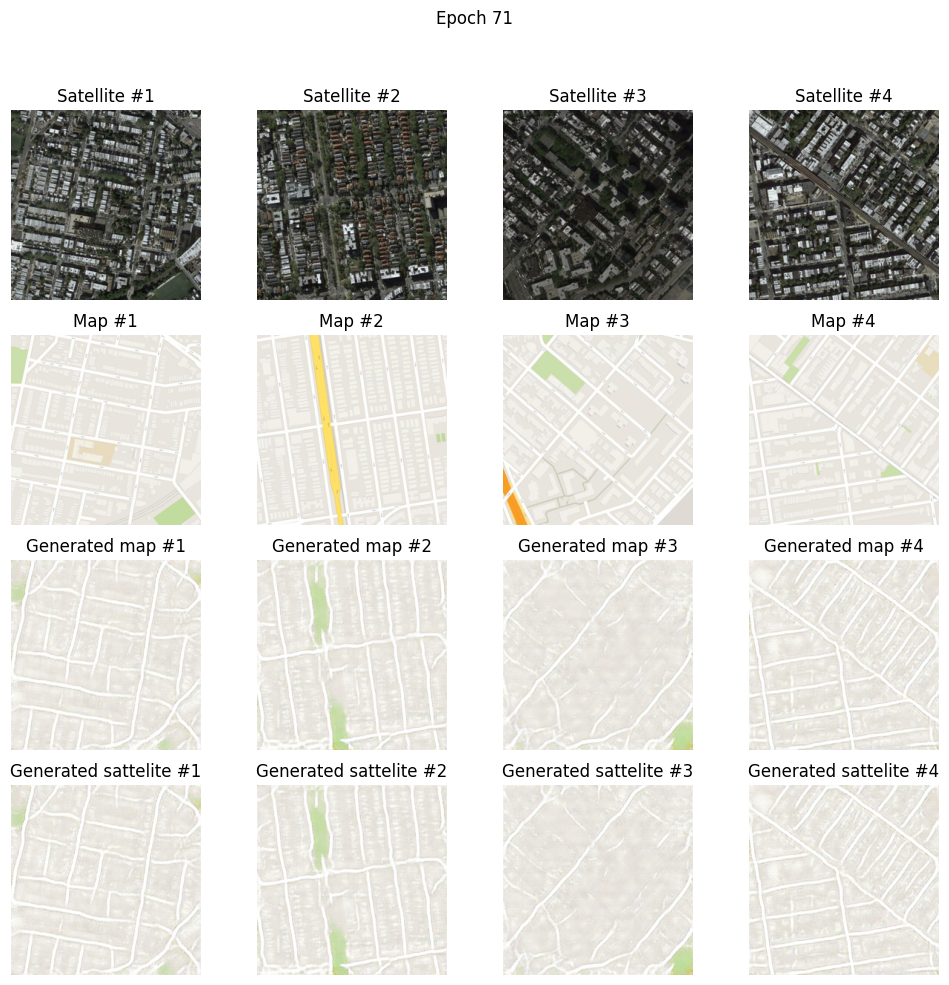

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.02it/s]


[Epoch 72/100]
Train: [G1 loss: 3.183905267715454] [D1 loss: 0.22912693321704863] [G2 loss: 4.316452572562477] [D2 loss: 0.247134870019826] ETA: 88.19974517822266
Val: [G1 loss: 2.8845769708806817] [D1 loss: 0.19220563498410312] [G2 loss: 3.9832034327767114] [D2 loss: 0.15719733319499277]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.03it/s]


[Epoch 73/100]
Train: [G1 loss: 3.202317773212086] [D1 loss: 0.22843126248229634] [G2 loss: 4.343515467643738] [D2 loss: 0.24160919148813595] ETA: 88.57039999961853
Val: [G1 loss: 2.319113753058694] [D1 loss: 0.181487652388486] [G2 loss: 1.7415236776525325] [D2 loss: 0.3110482692718506]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.13it/s]


[Epoch 74/100]
Train: [G1 loss: 3.301292072642933] [D1 loss: 0.2556628246199001] [G2 loss: 4.567219002680345] [D2 loss: 0.26499510299075735] ETA: 87.82372760772705
Val: [G1 loss: 2.3927470337260854] [D1 loss: 0.21855507113716818] [G2 loss: 5.381631851196289] [D2 loss: 0.33325888351960614]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.21it/s]


[Epoch 75/100]
Train: [G1 loss: 3.3187134168364785] [D1 loss: 0.2142229214310646] [G2 loss: 3.7889098730954256] [D2 loss: 0.28014507510445336] ETA: 87.65060114860535
Val: [G1 loss: 3.141529581763528] [D1 loss: 0.2589394748210907] [G2 loss: 2.07945733720606] [D2 loss: 0.2503411796959964]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.12it/s]


[Epoch 76/100]
Train: [G1 loss: 3.248959797078913] [D1 loss: 0.21060245551846243] [G2 loss: 4.08949849172072] [D2 loss: 0.24601155085997148] ETA: 87.2887659072876
Val: [G1 loss: 0.6966798603534698] [D1 loss: 0.6048878593878313] [G2 loss: 2.6867035735737193] [D2 loss: 0.3267798234115947]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.99it/s]


[Epoch 77/100]
Train: [G1 loss: 3.056591551954096] [D1 loss: 0.29181508936665274] [G2 loss: 4.124415532025424] [D2 loss: 0.24102302708409049] ETA: 87.65271377563477
Val: [G1 loss: 5.244913708079945] [D1 loss: 0.8299837166612799] [G2 loss: 3.598806229504672] [D2 loss: 0.11957169662822377]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.96it/s]


[Epoch 78/100]
Train: [G1 loss: 3.076781603423032] [D1 loss: 0.25195253897796976] [G2 loss: 4.156725335121155] [D2 loss: 0.27173600589687175] ETA: 88.00685095787048
Val: [G1 loss: 1.7947893684560603] [D1 loss: 0.2525313916531476] [G2 loss: 2.413539257916537] [D2 loss: 0.20030139928514307]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.62s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.92it/s]


[Epoch 79/100]
Train: [G1 loss: 3.3377515597776934] [D1 loss: 0.16862057190049778] [G2 loss: 4.203798012299971] [D2 loss: 0.2118552259423516] ETA: 88.94334363937378
Val: [G1 loss: 3.4937370907176626] [D1 loss: 0.09778388792818243] [G2 loss: 2.551080281084234] [D2 loss: 0.23328714479099621]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.99it/s]


[Epoch 80/100]
Train: [G1 loss: 3.4220093380321157] [D1 loss: 0.2990902568128976] [G2 loss: 4.253842622583563] [D2 loss: 0.2514661379158497] ETA: 88.17693495750427
Val: [G1 loss: 2.5575797991319136] [D1 loss: 0.27441178397698834] [G2 loss: 4.066051027991555] [D2 loss: 0.2357203012162989]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.06it/s]


[Epoch 81/100]
Train: [G1 loss: 3.0479167504744096] [D1 loss: 0.20415772551840003] [G2 loss: 4.42688852223483] [D2 loss: 0.22569442851976915] ETA: 88.21639275550842
Val: [G1 loss: 1.0071161822839216] [D1 loss: 0.4116134995763952] [G2 loss: 3.0633755813945425] [D2 loss: 0.11982388523491946]
maps: 1.0, 0.20784318447113037
maps: 1.0, 0.6000000238418579
maps: 1.0, 0.5372549295425415
maps: 1.0, 0.24705886840820312


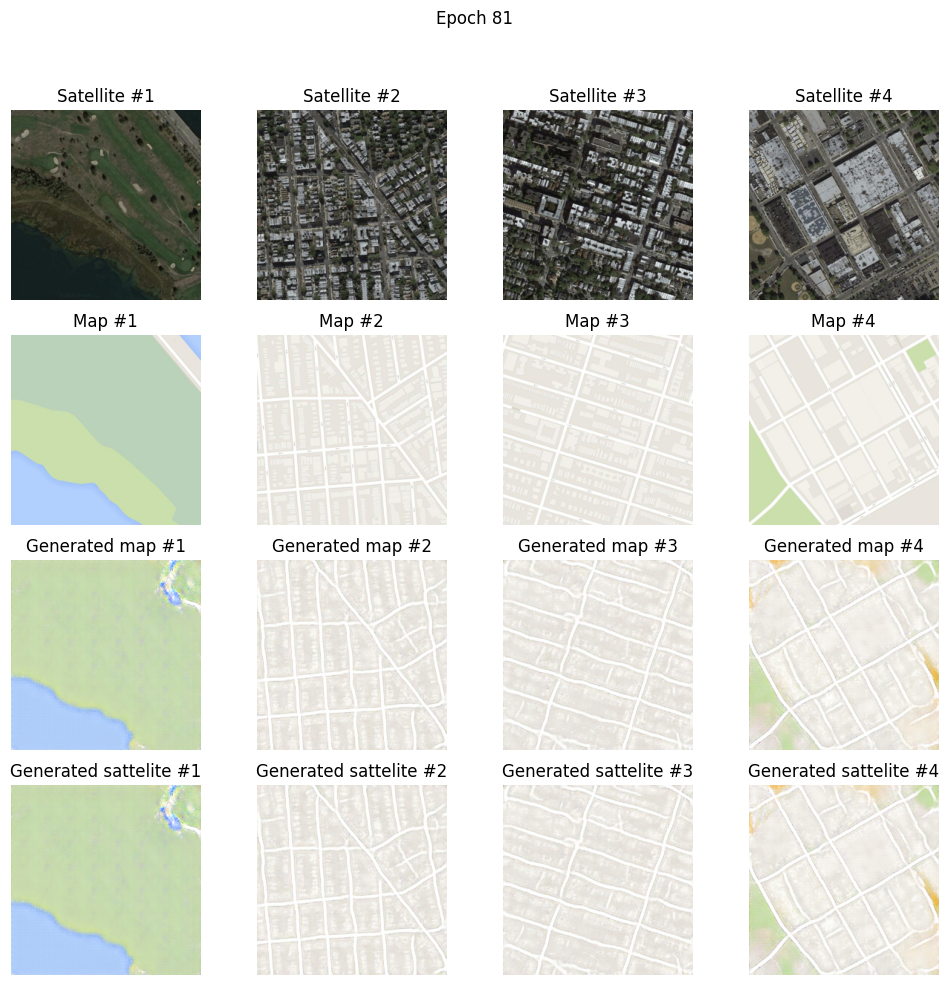

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.10it/s]


[Epoch 82/100]
Train: [G1 loss: 3.1488406159661033] [D1 loss: 0.22220597456802021] [G2 loss: 4.624717283248901] [D2 loss: 0.21406217867677862] ETA: 87.77266812324524
Val: [G1 loss: 3.747750694101507] [D1 loss: 0.2641833749684421] [G2 loss: 2.6157838864759966] [D2 loss: 0.12336552549492229]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.13it/s]


[Epoch 83/100]
Train: [G1 loss: 3.0755224813114515] [D1 loss: 0.32304229749874636] [G2 loss: 4.448192152110013] [D2 loss: 0.2444508735429157] ETA: 87.28767943382263
Val: [G1 loss: 2.470627611333674] [D1 loss: 0.16815992106090893] [G2 loss: 3.400917400013317] [D2 loss: 0.12381828508593819]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.97it/s]


[Epoch 84/100]
Train: [G1 loss: 3.345299391313033] [D1 loss: 0.15262723592194644] [G2 loss: 4.479167847199873] [D2 loss: 0.20039882944388823] ETA: 88.09811592102051
Val: [G1 loss: 1.862104426730763] [D1 loss: 0.19591773369095541] [G2 loss: 3.6862479990178887] [D2 loss: 0.13505522364919836]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.13it/s]


[Epoch 85/100]
Train: [G1 loss: 3.2758536783131684] [D1 loss: 0.20492611635815014] [G2 loss: 4.115963608568365] [D2 loss: 0.2547762289643288] ETA: 88.18576455116272
Val: [G1 loss: 1.902927734635093] [D1 loss: 0.20596958967772397] [G2 loss: 2.3714001178741455] [D2 loss: 0.16747436875646765]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.13it/s]


[Epoch 86/100]
Train: [G1 loss: 3.40953582091765] [D1 loss: 0.24049794741652228] [G2 loss: 4.273340454968539] [D2 loss: 0.24300716031681407] ETA: 88.00217294692993
Val: [G1 loss: 2.7742248448458584] [D1 loss: 0.18537802723321048] [G2 loss: 2.6718898686495693] [D2 loss: 0.11829411441629584]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.09it/s]


[Epoch 87/100]
Train: [G1 loss: 3.2882824182510375] [D1 loss: 0.19280604638836601] [G2 loss: 3.951417912136425] [D2 loss: 0.25129441524093804] ETA: 88.48825573921204
Val: [G1 loss: 2.9763555093245073] [D1 loss: 0.22120518711480228] [G2 loss: 1.380444504997947] [D2 loss: 0.4794351702386683]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.96it/s]


[Epoch 88/100]
Train: [G1 loss: 3.0673339117657052] [D1 loss: 0.363669067485766] [G2 loss: 3.7708346822045065] [D2 loss: 0.27178561985492705] ETA: 88.11724781990051
Val: [G1 loss: 2.4207681742581455] [D1 loss: 0.2689566381952979] [G2 loss: 3.505200971256603] [D2 loss: 0.10901176929473877]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.02it/s]


[Epoch 89/100]
Train: [G1 loss: 2.9272469786080446] [D1 loss: 0.2781711296601729] [G2 loss: 4.150584598021074] [D2 loss: 0.23795951835133813] ETA: 87.65066051483154
Val: [G1 loss: 1.869172139601274] [D1 loss: 0.24077097665179858] [G2 loss: 2.607295339757746] [D2 loss: 0.1549210954796184]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.03it/s]


[Epoch 90/100]
Train: [G1 loss: 2.9894731760025026] [D1 loss: 0.19609805751930584] [G2 loss: 4.207722161032937] [D2 loss: 0.22904419790614736] ETA: 87.8241970539093
Val: [G1 loss: 2.399621920152144] [D1 loss: 0.23300588537346234] [G2 loss: 3.768163030797785] [D2 loss: 0.17731974883513016]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.08it/s]


[Epoch 91/100]
Train: [G1 loss: 3.1708659887313844] [D1 loss: 0.2261707524007017] [G2 loss: 4.351924874565818] [D2 loss: 0.21821704804897307] ETA: 87.82603740692139
Val: [G1 loss: 0.4676171459934928] [D1 loss: 0.811537813056599] [G2 loss: 6.879594976251775] [D2 loss: 0.48022500764239917]
maps: 1.0, 0.27843141555786133
maps: 1.0, 0.17647063732147217
maps: 1.0, 0.2705882787704468
maps: 1.0, -0.9215686321258545


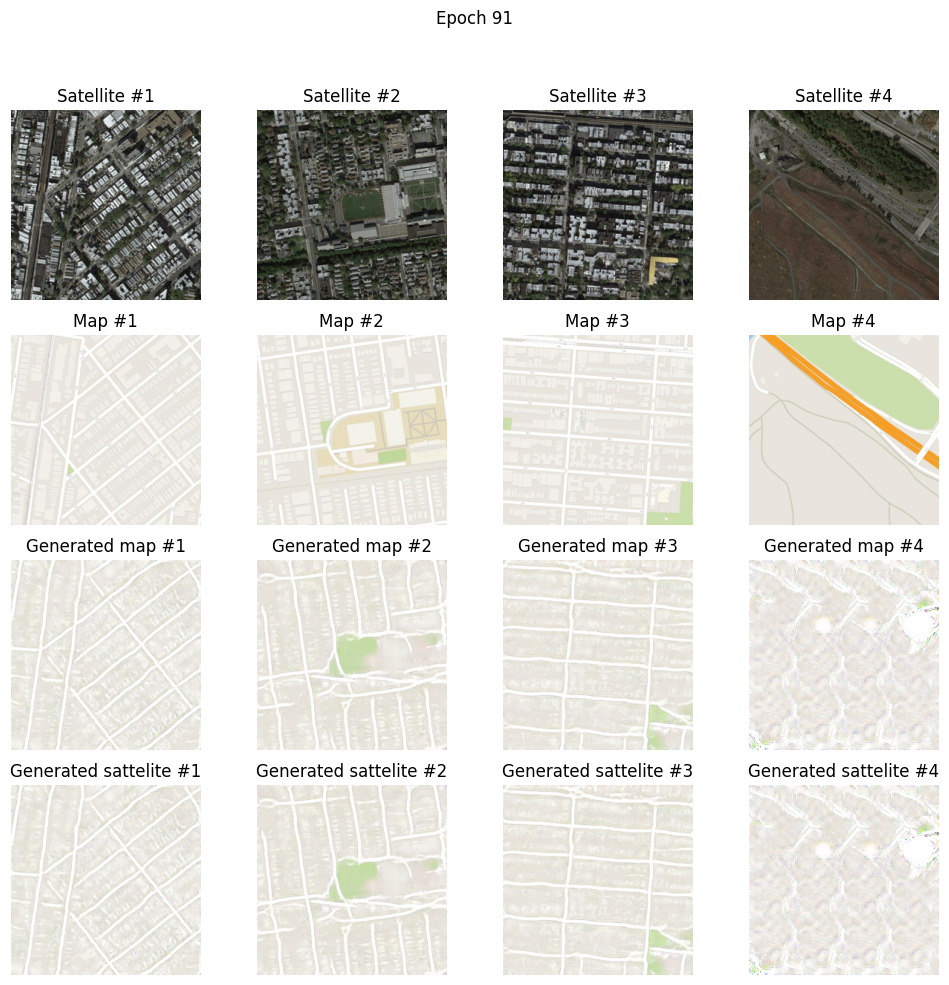

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.10it/s]


[Epoch 92/100]
Train: [G1 loss: 3.091934364492243] [D1 loss: 0.22406677319244905] [G2 loss: 4.426747274398804] [D2 loss: 0.21217267310077495] ETA: 87.93126583099365
Val: [G1 loss: 2.8533593091097744] [D1 loss: 0.21127166124907407] [G2 loss: 5.19956111907959] [D2 loss: 0.10157878561453386]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:29<00:00,  1.63s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.13it/s]


[Epoch 93/100]
Train: [G1 loss: 3.3247613224116237] [D1 loss: 0.243585989150134] [G2 loss: 4.383302741700953] [D2 loss: 0.2495365622368726] ETA: 89.59052896499634
Val: [G1 loss: 2.437973369251598] [D1 loss: 0.19373905116861517] [G2 loss: 4.9249702366915615] [D2 loss: 0.3413532999428836]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.60s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.05it/s]


[Epoch 94/100]
Train: [G1 loss: 3.167495957287875] [D1 loss: 0.2097413266246969] [G2 loss: 4.484965315732089] [D2 loss: 0.19627191126346588] ETA: 88.0101478099823
Val: [G1 loss: 1.7658398368141868] [D1 loss: 0.2424985251643441] [G2 loss: 2.3221600597554986] [D2 loss: 0.23581506582823666]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:28<00:00,  1.61s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.18it/s]


[Epoch 95/100]
Train: [G1 loss: 3.4162479053844104] [D1 loss: 0.19936296601187098] [G2 loss: 4.3097399018027565] [D2 loss: 0.21912414851513776] ETA: 88.65384221076965
Val: [G1 loss: 0.9739672487432306] [D1 loss: 0.41241301189769397] [G2 loss: 1.5149830904873935] [D2 loss: 0.36832343719222327]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  2.07it/s]


[Epoch 96/100]
Train: [G1 loss: 3.4244584235278044] [D1 loss: 0.21679056151346726] [G2 loss: 4.1956174633719705] [D2 loss: 0.22914132868701761] ETA: 87.56453847885132
Val: [G1 loss: 2.4521882967515425] [D1 loss: 0.19918707419525494] [G2 loss: 3.0294481190768154] [D2 loss: 0.127039834856987]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:29<00:00,  1.63s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:06<00:00,  1.80it/s]


[Epoch 97/100]
Train: [G1 loss: 3.2790472919290714] [D1 loss: 0.16062800884246825] [G2 loss: 4.304215876622633] [D2 loss: 0.28462515866214577] ETA: 89.73484325408936
Val: [G1 loss: 1.193379440090873] [D1 loss: 0.36889971657232806] [G2 loss: 3.9729274836453525] [D2 loss: 0.10706049136140129]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.23it/s]


[Epoch 98/100]
Train: [G1 loss: 3.423460279811512] [D1 loss: 0.2577581573616375] [G2 loss: 4.261945455724542] [D2 loss: 0.2015391693873839] ETA: 87.50405406951904
Val: [G1 loss: 2.8131548274647105] [D1 loss: 0.20113392174243927] [G2 loss: 4.173809593374079] [D2 loss: 0.16007174280556766]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:05<00:00,  1.96it/s]


[Epoch 99/100]
Train: [G1 loss: 3.4139917742122305] [D1 loss: 0.16417927999388088] [G2 loss: 4.355970087918368] [D2 loss: 0.23442527787251907] ETA: 87.3082218170166
Val: [G1 loss: 4.374299006028608] [D1 loss: 0.2228939181024378] [G2 loss: 3.0076524127613413] [D2 loss: 0.1155580451542681]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 55/55 [01:27<00:00,  1.59s/it]


Validation


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.27it/s]

[Epoch 100/100]
Train: [G1 loss: 3.5393933908505875] [D1 loss: 0.2923365340314128] [G2 loss: 4.169815176183527] [D2 loss: 0.24607481956481933] ETA: 87.52304697036743
Val: [G1 loss: 2.719333366914229] [D1 loss: 0.29031541401689703] [G2 loss: 3.417762106115168] [D2 loss: 0.11621969464150342]


In [7]:
"""
VINI REMEMBER:
gX_loss_<train|val> - generator X EPOCH loss
dX_loss_<train|val> - discriminator X EPOCH loss
gX_loss - generator X BATCH loss
dX_loss - discriminator X BATCH loss
"""

models_dir = '/home/lucas/p/python/data-science/machine-learning/final_project_ia376/projetos/satellite2map/satellite2map/models/checkpoints'

for epoch in range(hyperparams.n_epochs):
    g1_loss_train=0.
    d1_loss_train=0.
    g2_loss_train=0.
    d2_loss_train=0.
    start = time.time()
    for sat_real, map_real in tqdm(train_dataloader):
        sat_real = sat_real.to(DEVICE)
        map_real = map_real.to(DEVICE)

        # Training discriminators
        discriminator1.train()
        discriminator2.train()
        with torch.autocast(device_type=DEVICE):
            # Generating fake data
            map_fake = generator1(sat_real)
            sat_fake = generator2(map_real)

            # Discriminator 1
            fake_pred1 = discriminator1(map_fake.detach(), sat_real)
            real_pred1 = discriminator1(map_real, sat_real)
            d1_loss = d_criterion(fake_pred1, real_pred1)

            # Discriminator 2
            fake_pred2 = discriminator2(sat_fake.detach(), map_real)
            real_pred2 = discriminator2(sat_real, map_real)
            d2_loss = d_criterion(fake_pred2, real_pred2)

            # Combined loss
            d_loss = d1_loss + d2_loss

        # Discriminator`s params update
        d1_optimizer.zero_grad()
        d2_optimizer.zero_grad()
        d_loss.backward()
        d1_optimizer.step()
        d2_optimizer.step()

        # Train generators
        generator1.train()
        generator2.train()
        with torch.autocast(device_type=DEVICE):
            # Generator's loss
            fake_pred1 = discriminator1(map_fake, sat_real)
            g1_loss = g_criterion(map_fake, map_real, fake_pred1)
            fake_pred2 = discriminator2(sat_fake, map_real)
            g2_loss = g_criterion(sat_fake, sat_real, fake_pred2)

            # Cycle loss
            sat_reconstructed = generator2(map_fake)
            map_reconstructed = generator1(sat_fake)
            cycle1_loss = cc_criterion(sat_real, sat_reconstructed)
            cycle2_loss = cc_criterion(map_real, map_reconstructed)

            # Combined loss
            g_loss = g1_loss + g2_loss + cycle1_loss + cycle2_loss
        
        # Generator's params update
        g1_optimizer.zero_grad()
        g2_optimizer.zero_grad()
        g_loss.backward()
        g1_optimizer.step()
        g2_optimizer.step()

        # add batch loss to epoch loss
        g1_loss_train += g1_loss.item()
        d1_loss_train += d1_loss.item()
        g2_loss_train += g2_loss.item()
        d2_loss_train += d2_loss.item()

    # mean epoch losses
    g1_loss_train /= len(train_dataloader)
    d1_loss_train /= len(train_dataloader)
    g2_loss_train /= len(train_dataloader)
    d2_loss_train /= len(train_dataloader)

    # count timeframe
    end = time.time()
    tm = (end - start)

    # validation
    generator1.eval()
    generator2.eval()
    discriminator1.eval()
    discriminator2.eval()
    g1_loss_val=0.
    d1_loss_val=0.
    g2_loss_val=0.
    d2_loss_val=0.
    tqdm.write('Validation')
    for sat_real, map_real in tqdm(val_dataloader):
        sat_real = sat_real.to(DEVICE)
        map_real = map_real.to(DEVICE)

        with torch.no_grad():
            # Generator's loss
            map_fake = generator1(sat_real)
            sat_fake = generator2(map_real)
            fake_pred1 = discriminator1(map_fake, sat_real)
            fake_pred2 = discriminator2(sat_fake, map_real)
            g1_loss = g_criterion(map_fake, map_real, fake_pred1)
            g2_loss = g_criterion(sat_fake, sat_real, fake_pred2)

            # Discriminator`s loss
            real_pred1 = discriminator1(map_real, sat_real)
            real_pred2 = discriminator2(sat_real, map_real)
            d1_loss = d_criterion(fake_pred1, real_pred1)
            d2_loss = d_criterion(fake_pred2, real_pred2)

        # add batch loss to epoch loss
        g1_loss_val += g1_loss.item()
        d1_loss_val += d1_loss.item()
        g2_loss_val += g2_loss.item()
        d2_loss_val += d2_loss.item()
    
    # mean epoch losses
    g1_loss_val /= len(val_dataloader)
    d1_loss_val /= len(val_dataloader)
    g2_loss_val /= len(val_dataloader)
    d2_loss_val /= len(val_dataloader)

    # logging
    # wandb.log({
    #     "g1_train_loss": g1_loss_train, 
    #     "d1_train_loss": d1_loss_train,
    #     "g2_train_loss": g2_loss_train,
    #     "d2_train_loss": d2_loss_train,
    #     "g1_val_loss":   g1_loss_val, 
    #     "d1_val_loss":   d1_loss_val,
    #     "g2_val_loss":   g2_loss_val,
    #     "d2_val_loss":   d2_loss_val,
    #     })
    print(f"[Epoch {epoch+1}/{hyperparams.n_epochs}]")
    print(f"Train: [G1 loss: {g1_loss_train}] [D1 loss: {d1_loss_train}] [G2 loss: {g2_loss_train}] [D2 loss: {d2_loss_train}] ETA: {tm}")
    print(f"Val: [G1 loss: {g1_loss_val}] [D1 loss: {d1_loss_val}] [G2 loss: {g2_loss_val}] [D2 loss: {d2_loss_val}]")

    if epoch % 10!=0:
        continue

    # saving the model every 10 epochs
    torch.save({
        'g1_weights': generator1.state_dict(), 
        'd1_weights': discriminator1.state_dict(), 
        'g2_weights': generator2.state_dict(),
        'd2_weights': discriminator2.state_dict()},
        f'{models_dir}/models_{epoch}.pth')

    # visualizing the results
    fig = plt.figure(figsize=(10, 10))
    # random_batch = val_dataset[torch.randint(0, len(val_dataloader), (4,))]
    indexes = torch.randint(0, len(val_dataset), (4,))
    random_batch = [val_dataset[i] for i in indexes]
    for i, (sat, map) in enumerate(random_batch):
        i = i + 1
        gen_map = generator1(sat.unsqueeze(0).to(DEVICE)).squeeze(0).cpu()
        gen_sat = generator2(map.unsqueeze(0).to(DEVICE)).squeeze(0).cpu()

        ax = fig.add_subplot(4, 4, i)
        ax.set_title('Satellite #{}'.format(i))
        ax.axis('off')
        sat = sat * 0.5 + 0.5
        plt.imshow(sat.permute((1, 2, 0)).numpy())

        ax = fig.add_subplot(4, 4, i+4)
        ax.set_title('Map #{}'.format(i))
        ax.axis('off')
        print(f'maps: {map.max()}, {map.min()}')
        map = map * 0.5 + 0.5
        plt.imshow(map.permute((1, 2, 0)).numpy())

        ax = fig.add_subplot(4, 4, i+8)
        ax.set_title('Generated map #{}'.format(i))
        ax.axis('off')
        gen_map = gen_map * 0.5 + 0.5
        plt.imshow(gen_map.permute((1, 2, 0)).cpu().detach().numpy())

        ax = fig.add_subplot(4, 4, i+12)
        ax.set_title('Generated sattelite #{}'.format(i))
        ax.axis('off')
        gen_sat = gen_sat * 0.5 + 0.5
        plt.imshow(gen_sat.permute((1, 2, 0)).cpu().detach().numpy())

        if i == 4:
            fig.suptitle(f'Epoch {epoch+1}')
            fig.tight_layout()
            fig.subplots_adjust(top=0.88)
            plt.show()
            break